### CHeck Data Loader

In [2]:
import torch
import os, sys

sys.path.append('../')

from model.attention_map import AttentionMapGray
from data_loader import ABDataset

from torch.utils.data import DataLoader

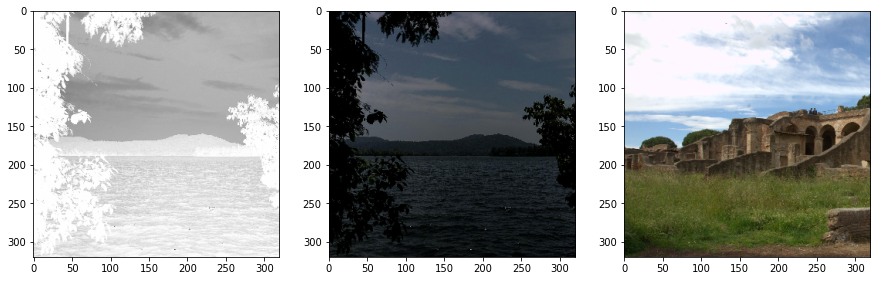

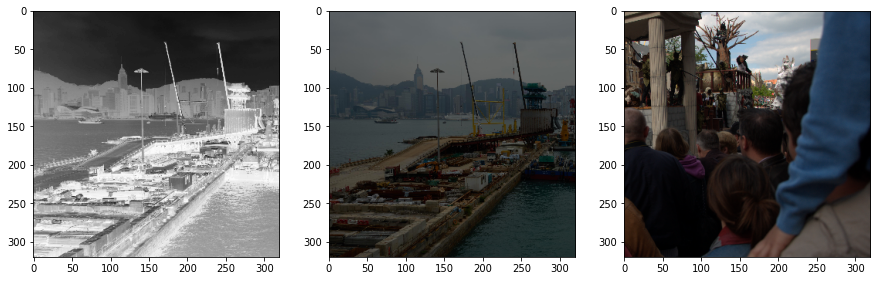

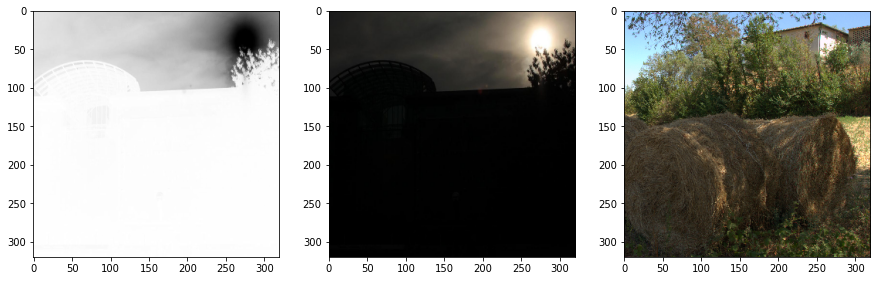

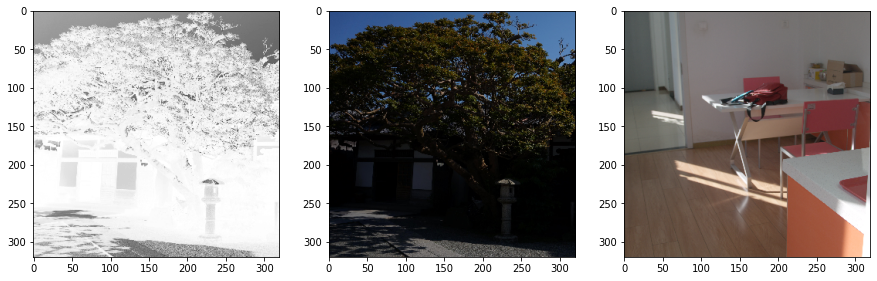

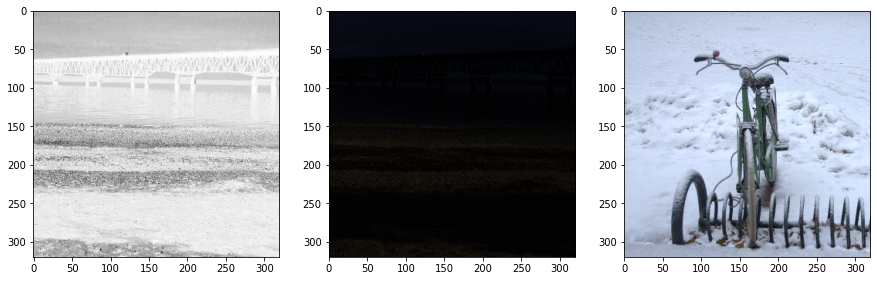

...

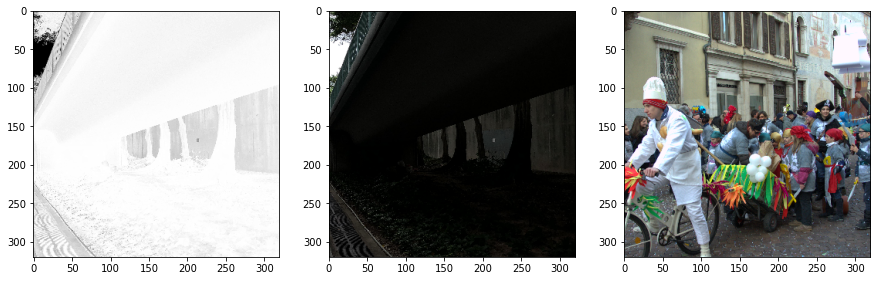

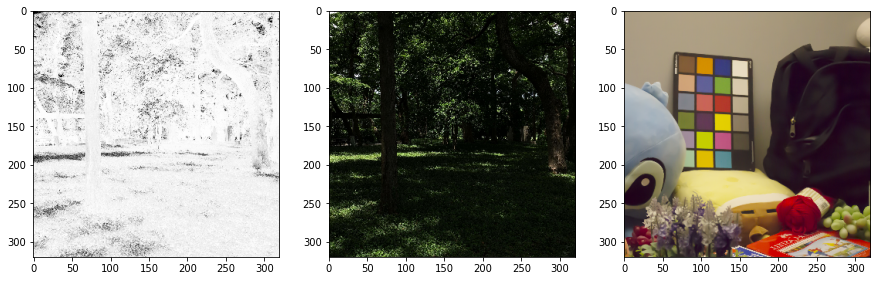

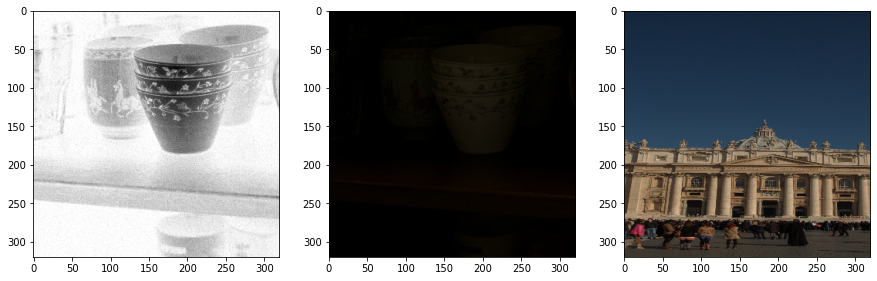

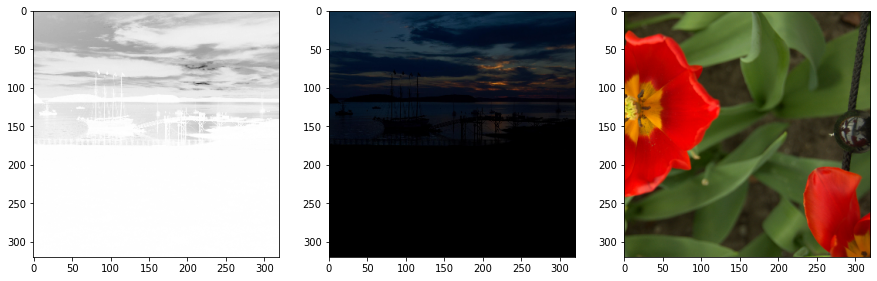

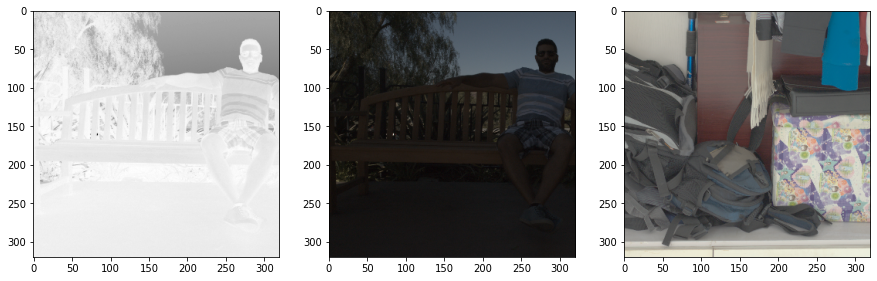

In [61]:
attention_map = AttentionMapGray()
dataset_root = '/home/student/Documents/alena/thesis/enlighte-gan-dataset'

dataset = ABDataset(dataset_root, attention_map, subroot_dark='dark_large', subroot_normal='normal_large')
dataset = DataLoader(dataset, batch_size=7, num_workers=1)

for i, data in enumerate(dataset):
    img_dark = data['dark']
    img_normal = data['normal']
    img_gray = data['gray']
    
    if i == 20:
        break
    fig, ax = plt.subplots(ncols=3, figsize=(15, 15))
    ax[0].imshow(img_gray[0, :, :, :].permute(1, 2, 0), cmap='gray')
    ax[1].imshow(((img_dark[0, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    ax[2].imshow(((img_normal[0, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    plt.show();
    

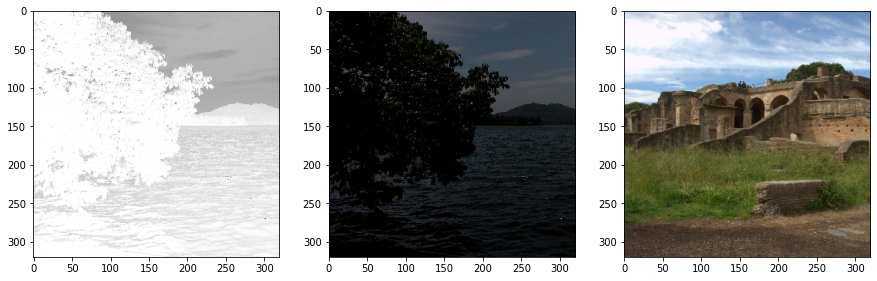

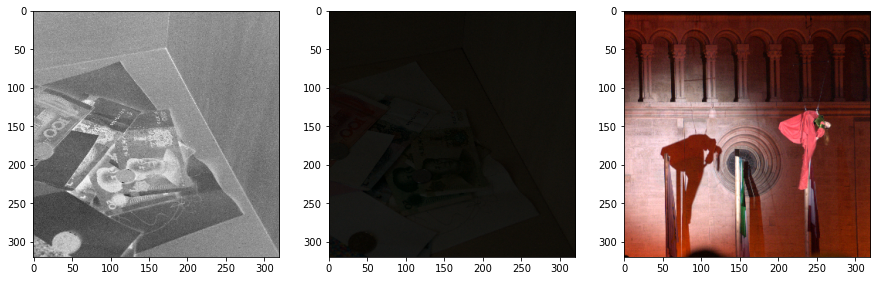

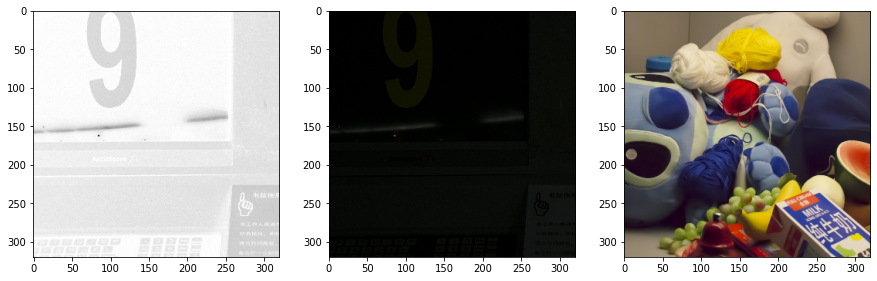

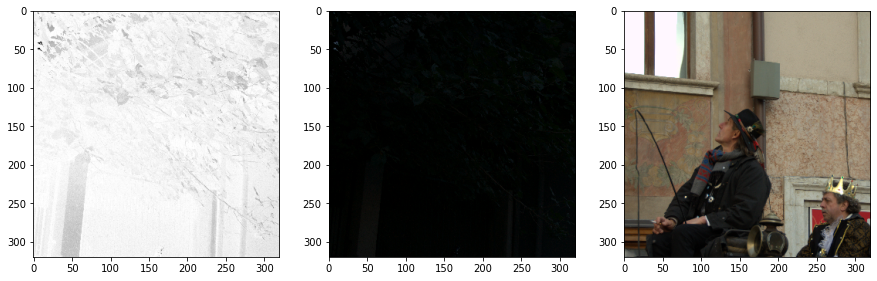

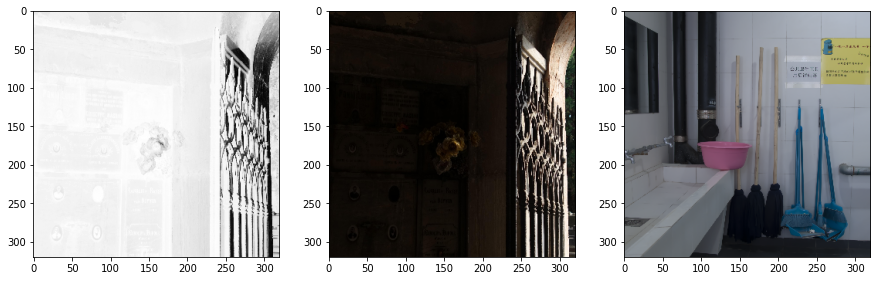

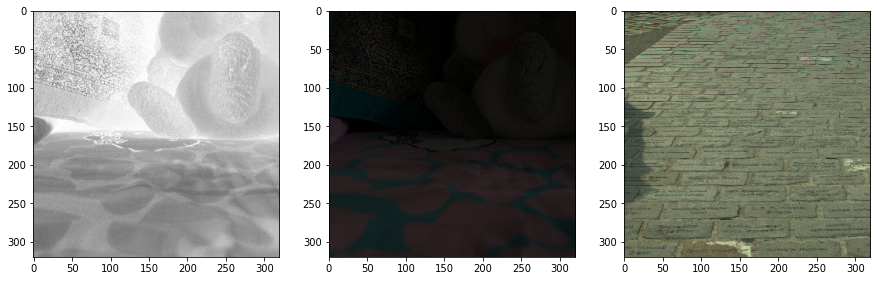

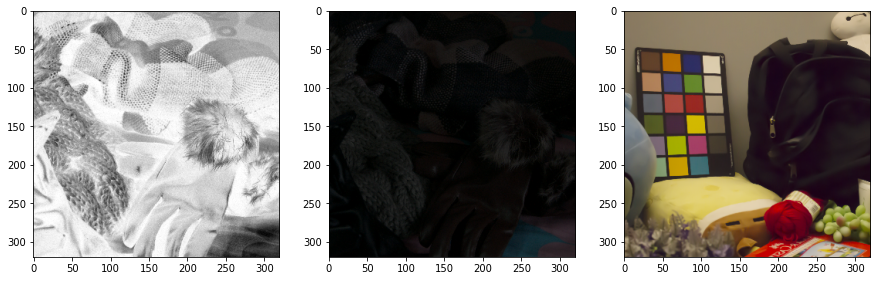

In [53]:
import matplotlib.pyplot as plt
import numpy as np


# n = 
for n in range(7):
    fig, ax = plt.subplots(ncols=3, figsize=(15, 15))
    ax[0].imshow(img_gray[n, :, :, :].permute(1, 2, 0), cmap='gray')
    ax[1].imshow(((img_dark[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    ax[2].imshow(((img_normal[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    plt.show();

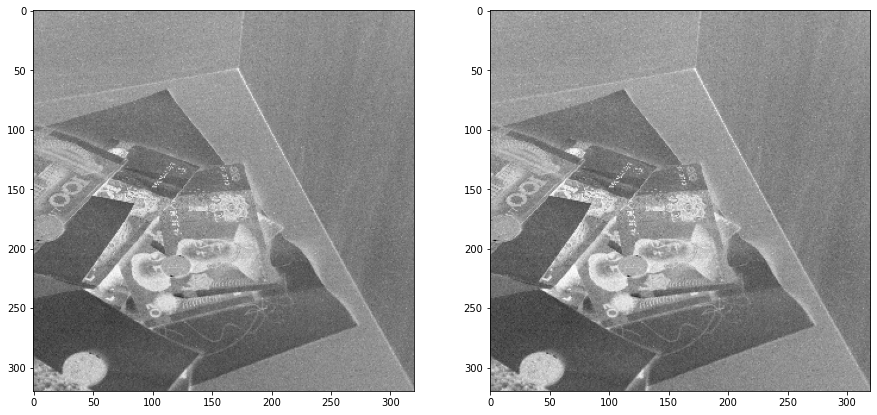

In [50]:
import cv2

n=1
image = ((img_dark[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8)
image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) / 255

fig, ax = plt.subplots(ncols=2, figsize=(15, 15))
ax[0].imshow(img_gray[n, :, :, :].permute(1, 2, 0), cmap='gray')
ax[1].imshow(1 - image_gray, cmap='gray')

In [47]:
img_gray[0, :, :, :].permute(1, 2, 0).numpy()[-3:, -3:]

array([[[0.9449726 ],
        [0.9449726 ],
        [0.9523686 ]],

       [[0.96890587],
        [0.9610627 ],
        [0.9610627 ]],

       [[0.976749  ],
        [0.9649843 ],
        [0.976749  ]]], dtype=float32)

In [48]:
(1 - image_gray.reshape(320, 320, 1))[-3:, -3:]

array([[[0.94901961],
        [0.94901961],
        [0.95686275]],

       [[0.97254902],
        [0.96470588],
        [0.96470588]],

       [[0.98039216],
        [0.96862745],
        [0.98039216]]])

### Check Local Discriminator

In [1]:
import torch
import os, sys

sys.path.append('../')

# from model.generators.enlighten_gan_generator import GeneratorEnlightenGAN
from model.discriminators.enlighten_gan_global_discriminator import GlobalDiscriminatorEnlightenGAN
from model.discriminators.enlighten_gan_local_discriminator import LocalDiscriminatorEnlightenGAN


In [2]:

netD_local = LocalDiscriminatorEnlightenGAN()

In [3]:
print(netD_local)

LocalDiscriminatorEnlightenGAN(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
  )
)


In [4]:
netD_global = GlobalDiscriminatorEnlightenGAN()

In [5]:
print(netD_global)

GlobalDiscriminatorEnlightenGAN(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
  )
)
